#Import Library and Dataset

In [ ]:
!pip install tensorflow # Installs TensorFlow library
!pip install keras # Installs keras library

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers.experimental import preprocessing
from sklearn.metrics import classification_report
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing import image
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
import os
from datetime import datetime

%matplotlib inline

In [ ]:
drive.mount('/content/gdrive',force_remount=True)

Mounted at /content/gdrive


#Prepare Data

In [ ]:
train_path = "/content/gdrive/MyDrive/dataset/6ClassDataset_1/train"
test_path = "/content/gdrive/MyDrive/dataset/6ClassDataset_1/test"
valid_path = "/content/gdrive/MyDrive/dataset/6ClassDataset_1/valid"

In [ ]:
BATCH_SIZE = 32
IMAGE_SIZE = 224
CLASS_SIZE = 6

In [ ]:
train_datagen = ImageDataGenerator(rescale=0)
train_generator = train_datagen.flow_from_directory(
        directory=train_path,
        target_size=(IMAGE_SIZE, IMAGE_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='categorical')

test_datagen = ImageDataGenerator(rescale=0)
test_generator = test_datagen.flow_from_directory(
        directory=test_path,
        target_size=(IMAGE_SIZE, IMAGE_SIZE),
        batch_size=BATCH_SIZE,
        shuffle = False,
        class_mode='categorical')

valid_datagen = ImageDataGenerator(rescale=0)
valid_generator = valid_datagen.flow_from_directory(
        directory=valid_path,
        target_size=(IMAGE_SIZE, IMAGE_SIZE),
        batch_size=BATCH_SIZE,
        shuffle = False,
        class_mode='categorical')

Found 586 images belonging to 6 classes.
Found 61 images belonging to 6 classes.
Found 57 images belonging to 6 classes.


In [ ]:
class_names = train_generator.class_indices
class_names

{'Acne and Rosacea Photos': 0,
 'Eczema Photos': 1,
 'Light Diseases and Disorders of Pigmentation': 2,
 'Normal skin': 3,
 'Psoriasis pictures Lichen Planus and related diseases': 4,
 'Urticaria Hives': 5}

#Create Model

In [ ]:
import random
SEED = 42
os.environ['PYTHONHASHSEED']=str(SEED)
os.environ['TF_CUDNN_DETERMINISTIC'] = '1'  # TF 2.1
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

In [ ]:
data_augmentation = keras.Sequential([preprocessing.RandomRotation(0.0)], name ="data_augmentation")

In [ ]:
base_model = keras.applications.MobileNetV3Small(input_shape=(224, 224, 3),include_top=False, weights='imagenet') # Load the MobileNetV3Small model
base_model.trainable = True # Enable to train Pre-Trained Model
inputs = tf.keras.layers.Input(shape=(224, 224, 3), name="input_layer") # Define input layer

In [ ]:
x = data_augmentation(inputs) # Apply Augmentation to the input images. this use for decrease overfit
x = base_model(x, training=False) # Pass Augmentation Data to base_model
x = layers.GlobalAveragePooling2D(name="GloPool")(x) # Create Global Average Pooling and input x to get output tensor that value = Dense's filter. this use for decrease feature map
outputs = tf.keras.layers.Dense(CLASS_SIZE, activation="softmax", name="output_layer")(x) # output layer that (output unit = CLASS_SIZE as image class, activation function is softmax  )
model_0 = tf.keras.Model(inputs, outputs) # Create Model name model_0 that have input layer, base mosel, output layer
model_0.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(0.0001),
              metrics=["accuracy"]) #Compile model_0 with categorical_crossentropy, adam's learning rate = 0.0001, metric by accuracy

In [ ]:
custom_early_stopping = EarlyStopping( # EarlyStopping is keras's callback function that stop training model before overfitting
    monitor='val_loss', # monitor at validation loss
    patience=10,
    min_delta=0.001, # if validation loss is not decrease at least 0.001 in 10 time
    mode='min' # need validtion loss to decrease
)

#Train Model

In [ ]:
start = datetime.now()

history = model_0.fit(train_generator, # Use from train generator
           epochs=30, # training round
           workers=0,
           steps_per_epoch=len(train_generator), # Use from batch size that can update each epoch for training
           validation_data=valid_generator, # Use from test generator
           validation_steps=len(valid_generator), # 25% of test data
           callbacks=[custom_early_stopping]) # Stop training when overfitting

print ('Execution Time: ',datetime.now()-start)

Epoch 1/30
19/19 [==============================] - 49s 430ms/step - loss: 1.7182 - accuracy: 0.3225 - val_loss: 1.2221 - val_accuracy: 0.5614
Epoch 2/30
19/19 [==============================] - 7s 376ms/step - loss: 1.1805 - accuracy: 0.5785 - val_loss: 0.9686 - val_accuracy: 0.5439
Epoch 3/30
19/19 [==============================] - 6s 314ms/step - loss: 0.8723 - accuracy: 0.7201 - val_loss: 0.7792 - val_accuracy: 0.7193
Epoch 4/30
19/19 [==============================] - 7s 376ms/step - loss: 0.6513 - accuracy: 0.7799 - val_loss: 0.6220 - val_accuracy: 0.7895
Epoch 5/30
19/19 [==============================] - 7s 352ms/step - loss: 0.4599 - accuracy: 0.8396 - val_loss: 0.5470 - val_accuracy: 0.8246
Epoch 6/30
19/19 [==============================] - 6s 323ms/step - loss: 0.3369 - accuracy: 0.8942 - val_loss: 0.5806 - val_accuracy: 0.8421
Epoch 7/30
19/19 [==============================] - 7s 378ms/step - loss: 0.2399 - accuracy: 0.9420 - val_loss: 0.5328 - val_accuracy: 0.8070
Epoch

In [ ]:
model_0.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 data_augmentation (Sequenti  (None, None, None, None)  0        
 al)                                                             
                                                                 
 MobilenetV3small (Functiona  (None, 7, 7, 576)        939120    
 l)                                                              
                                                                 
 GloPool (GlobalAveragePooli  (None, 576)              0         
 ng2D)                                                           
                                                                 
 output_layer (Dense)        (None, 6)                 3462      
                                                           

In [ ]:
# Evaluate the model on the test set

test_loss, test_acc = model_0.evaluate_generator(test_generator, steps=len(test_generator))
print('Test loss:', test_loss)
print('Test accuracy:', test_acc)

<ipython-input-39-6717daddbeb4>:3: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model_0.evaluate_generator(test_generator, steps=len(test_generator))


Test loss: 0.6722646355628967
Test accuracy: 0.8196721076965332


#Evaluate Model

In [ ]:
model_0.evaluate(test_generator)

2/2 [==============================] - 1s 309ms/step - loss: 0.6723 - accuracy: 0.8197


[0.6722646355628967, 0.8196721076965332]

In [ ]:
# Evaluate the model on the test set
start = datetime.now()
test_loss, test_acc = model_0.evaluate_generator(test_generator, steps=len(test_generator))
print('Test loss:', test_loss)
print('Test accuracy:', test_acc)
print('Test Time:',datetime.now()-start)

<ipython-input-41-0897c54d69da>:3: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  test_loss, test_acc = model_0.evaluate_generator(test_generator, steps=len(test_generator))


Test loss: 0.6722646355628967
Test accuracy: 0.8196721076965332
Test Time: 0:00:00.882883


2/2 [==============================] - 2s 413ms/step


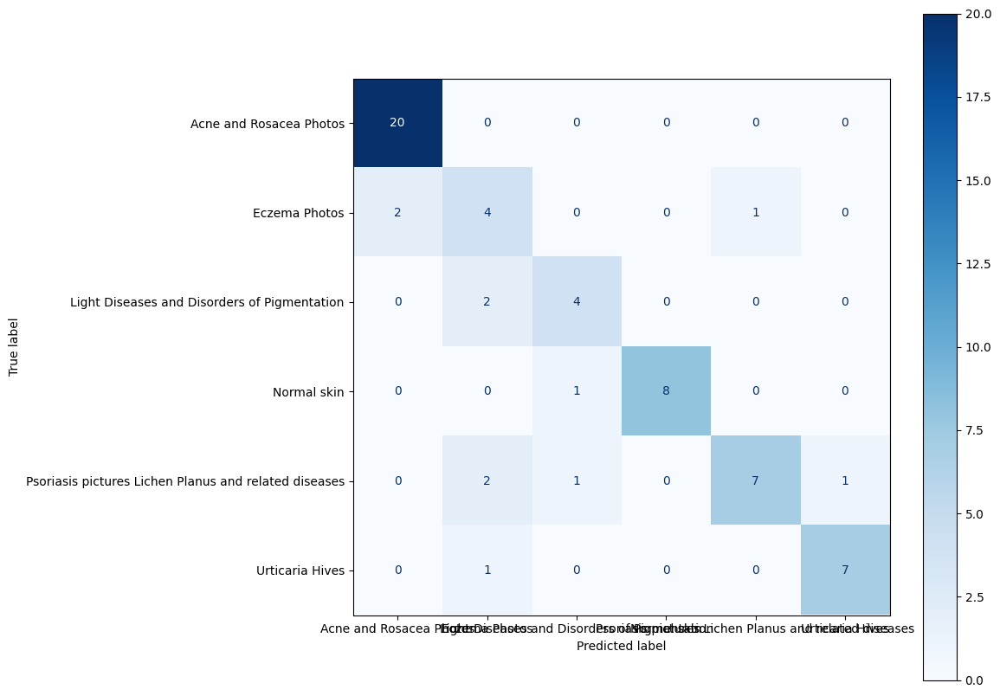

,class,specificity,sensitivity
0,0,0.951220,1.000000
1,1,0.907407,0.571429
2,2,0.963636,0.666667
3,3,1.000000,0.888889
4,4,0.980000,0.636364
5,5,0.981132,0.875000


In [ ]:
import sklearn as scikit_learn
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix
import numpy as np
from sklearn.metrics import precision_recall_fscore_support

test_true=test_generator.classes[test_generator.index_array]
test_pred_raw = model_0.predict(test_generator)
test_pred = np.argmax(test_pred_raw, axis=1)

cm = confusion_matrix(test_true, test_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
fig, ax = plt.subplots(figsize=(10,10))
disp.plot(ax=ax,cmap=plt.cm.Blues)
plt.show()


res = []
for l in [0,1,2,3,4,5]:
    pres,recall,_,_ = precision_recall_fscore_support(np.array(test_true)==l,np.array(test_pred)==l,pos_label=True,average=None)
    res.append([l,recall[0],recall[1]])

pd.DataFrame(res,columns = ['class','specificity','sensitivity'])

In [ ]:
from sklearn.metrics import classification_report


report = classification_report(test_true, test_pred,target_names=class_names)
print(report)

                                                       precision    recall  f1-score   support

                              Acne and Rosacea Photos       0.91      1.00      0.95        20
                                        Eczema Photos       0.44      0.57      0.50         7
         Light Diseases and Disorders of Pigmentation       0.67      0.67      0.67         6
                                          Normal skin       1.00      0.89      0.94         9
Psoriasis pictures Lichen Planus and related diseases       0.88      0.64      0.74        11
                                      Urticaria Hives       0.88      0.88      0.88         8

                                             accuracy                           0.82        61
                                            macro avg       0.80      0.77      0.78        61
                                         weighted avg       0.83      0.82      0.82        61



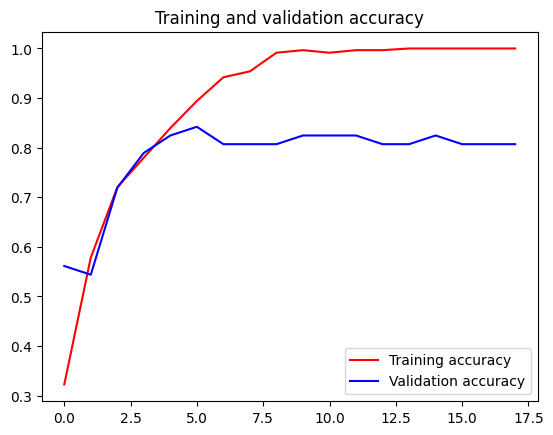

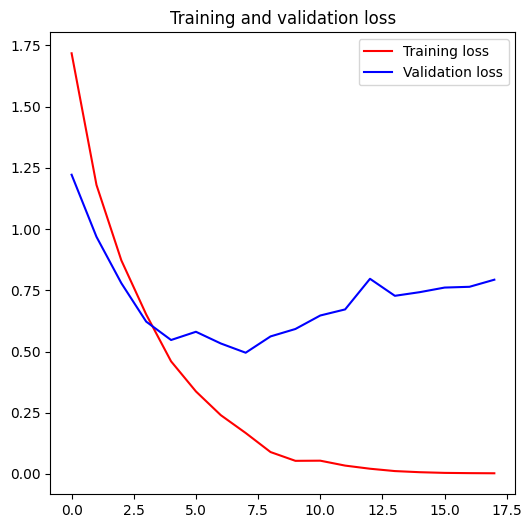

<Figure size 600x600 with 0 Axes>

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure(figsize=(6,6))

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend(loc=0)
plt.figure(figsize=(6,6))

plt.show()


#Test with real  image

Test image link https://drive.google.com/drive/folders/1oHO2ViaZgNA8n_KoxTWpwfXOSGuALIKw?usp=share_link

บริเวณ folder_path ใส่pathรูปที่ถ่ายมาหรือรูปที่พี่ใช้

In [ ]:
import os

# Path to the folder containing images to predict
folder_path = '/content/gdrive/MyDrive/dataset/for test 1'

1/1 [==============================] - 1s 1s/step
Image name: hives-Urticaria-Acute-68.jpg
Predicted class: Urticaria Hives (99.94%)
Prediction:  ['0.01%', '0.03%', '0.01%', '0.00%', '0.00%', '99.94%']


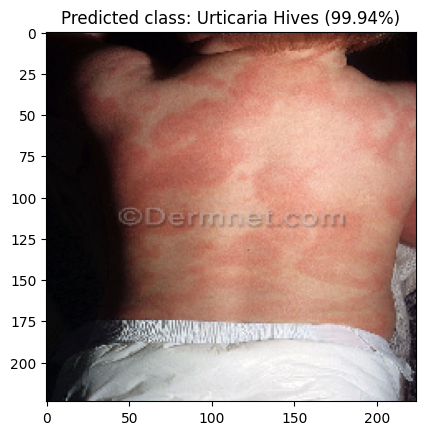



1/1 [==============================] - 0s 34ms/step
Image name: eczema-chronic-4.jpg
Predicted class: Eczema Photos (100.00%)
Prediction:  ['0.00%', '100.00%', '0.00%', '0.00%', '0.00%', '0.00%']


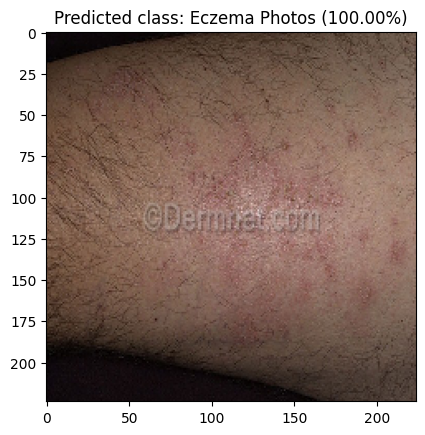



1/1 [==============================] - 0s 24ms/step
Image name: hives-Urticaria-Acute-55.jpg
Predicted class: Urticaria Hives (99.99%)
Prediction:  ['0.00%', '0.01%', '0.00%', '0.00%', '0.00%', '99.99%']


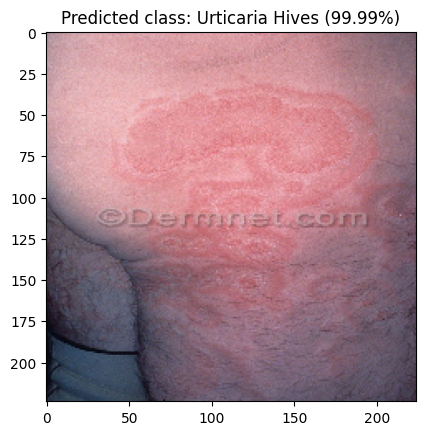



1/1 [==============================] - 0s 23ms/step
Image name: hives-Urticaria-Acute-67.jpg
Predicted class: Urticaria Hives (99.65%)
Prediction:  ['0.14%', '0.01%', '0.00%', '0.00%', '0.20%', '99.65%']


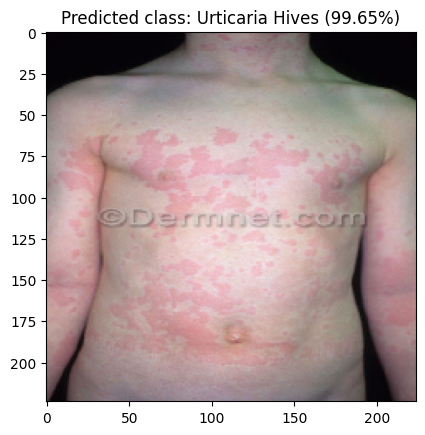



1/1 [==============================] - 0s 24ms/step
Image name: eczema-chronic-20.jpg
Predicted class: Eczema Photos (89.01%)
Prediction:  ['0.19%', '89.01%', '10.51%', '0.29%', '0.00%', '0.00%']


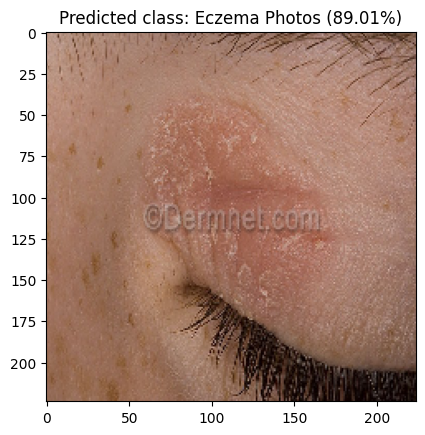



1/1 [==============================] - 0s 30ms/step
Image name: eczema-chronic-25.jpg
Predicted class: Eczema Photos (99.90%)
Prediction:  ['0.00%', '99.90%', '0.00%', '0.00%', '0.00%', '0.09%']


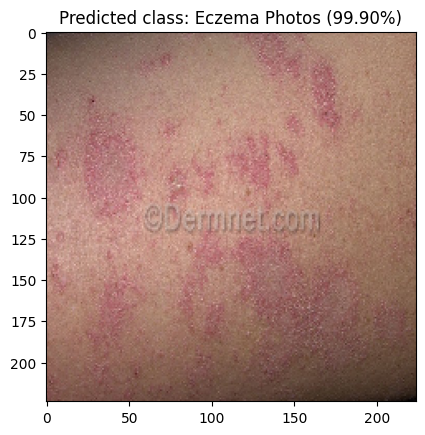



1/1 [==============================] - 0s 23ms/step
Image name: eczema-chronic-29.jpg
Predicted class: Acne and Rosacea Photos (61.38%)
Prediction:  ['61.38%', '37.30%', '0.73%', '0.00%', '0.01%', '0.58%']


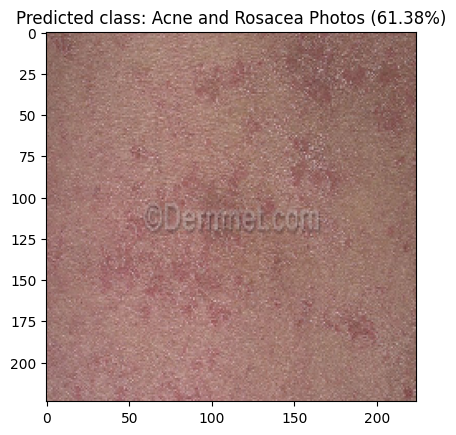



1/1 [==============================] - 0s 30ms/step
Image name: hives-Urticaria-Acute-102.jpg
Predicted class: Urticaria Hives (98.08%)
Prediction:  ['0.02%', '1.63%', '0.15%', '0.11%', '0.00%', '98.08%']


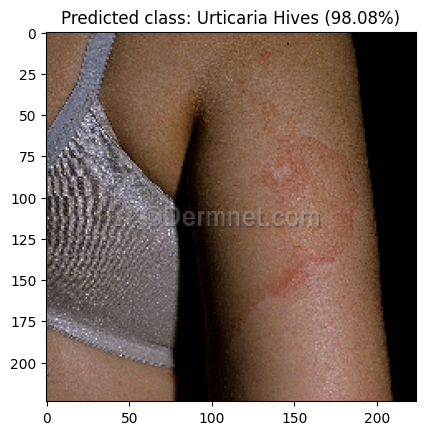



1/1 [==============================] - 0s 27ms/step
Image name: eczema-chronic-2.jpg
Predicted class: Eczema Photos (99.99%)
Prediction:  ['0.00%', '99.99%', '0.00%', '0.00%', '0.01%', '0.00%']


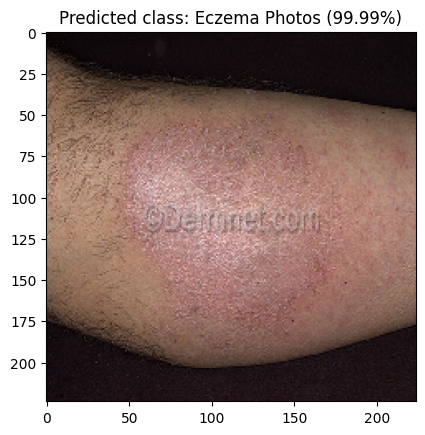



1/1 [==============================] - 0s 31ms/step
Image name: eczema-chronic-1.jpg
Predicted class: Psoriasis pictures Lichen Planus and related diseases (79.31%)
Prediction:  ['0.00%', '18.62%', '1.85%', '0.01%', '79.31%', '0.22%']


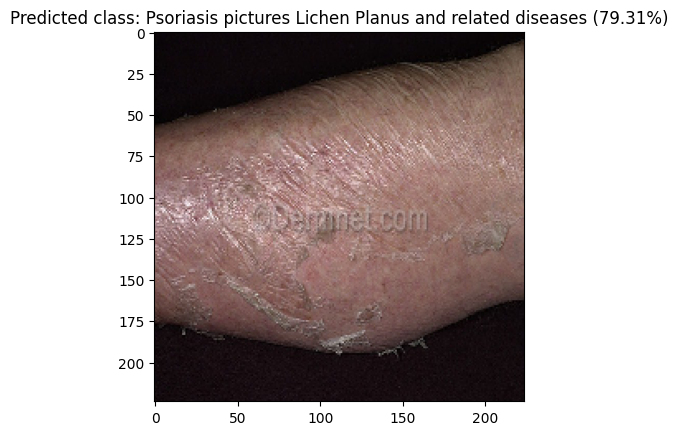



1/1 [==============================] - 0s 32ms/step
Image name: eczema-chronic-15.jpg
Predicted class: Acne and Rosacea Photos (99.11%)
Prediction:  ['99.11%', '0.12%', '0.50%', '0.00%', '0.00%', '0.27%']


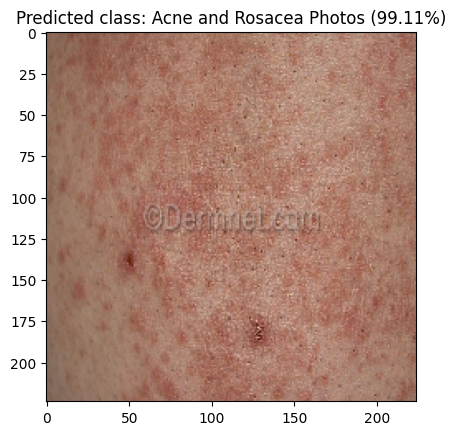



1/1 [==============================] - 0s 31ms/step
Image name: acne-cystic-6.jpg
Predicted class: Acne and Rosacea Photos (99.86%)
Prediction:  ['99.86%', '0.00%', '0.00%', '0.00%', '0.14%', '0.00%']


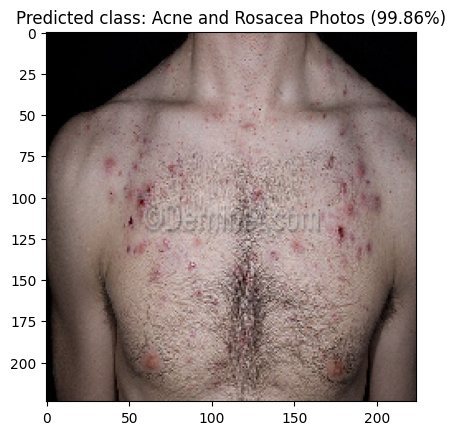



1/1 [==============================] - 0s 28ms/step
Image name: acne-cystic-92.jpg
Predicted class: Acne and Rosacea Photos (98.09%)
Prediction:  ['98.09%', '0.02%', '0.83%', '0.29%', '0.00%', '0.77%']


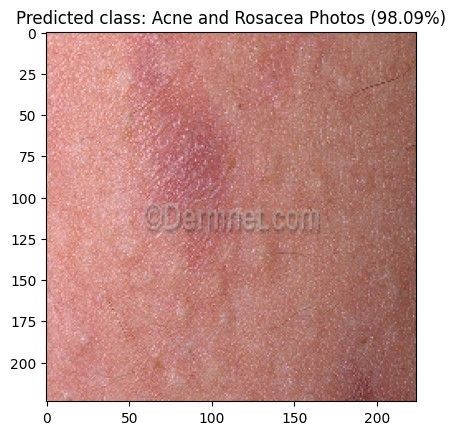



1/1 [==============================] - 0s 32ms/step
Image name: acne-cystic-85.jpg
Predicted class: Acne and Rosacea Photos (99.98%)
Prediction:  ['99.98%', '0.01%', '0.01%', '0.00%', '0.00%', '0.01%']


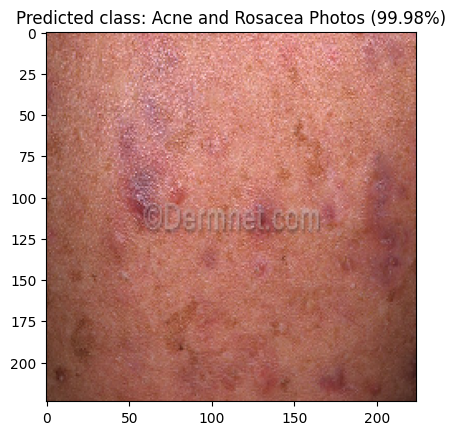



1/1 [==============================] - 0s 31ms/step
Image name: acne-cystic-95.jpg
Predicted class: Acne and Rosacea Photos (99.75%)
Prediction:  ['99.75%', '0.14%', '0.00%', '0.00%', '0.02%', '0.09%']


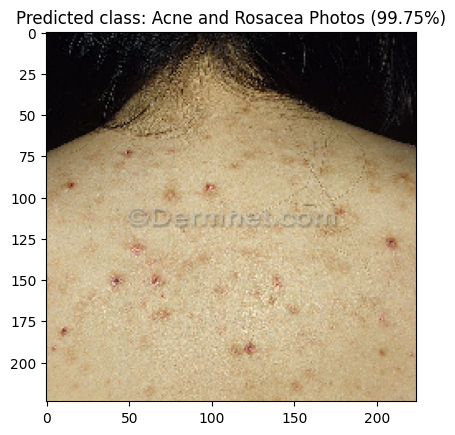



1/1 [==============================] - 0s 31ms/step
Image name: acne-cystic-61.jpg
Predicted class: Acne and Rosacea Photos (100.00%)
Prediction:  ['100.00%', '0.00%', '0.00%', '0.00%', '0.00%', '0.00%']


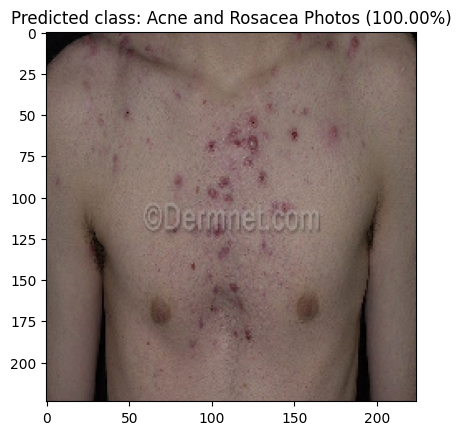



1/1 [==============================] - 0s 32ms/step
Image name: acne-cystic-90.jpg
Predicted class: Acne and Rosacea Photos (99.86%)
Prediction:  ['99.86%', '0.10%', '0.04%', '0.00%', '0.00%', '0.00%']


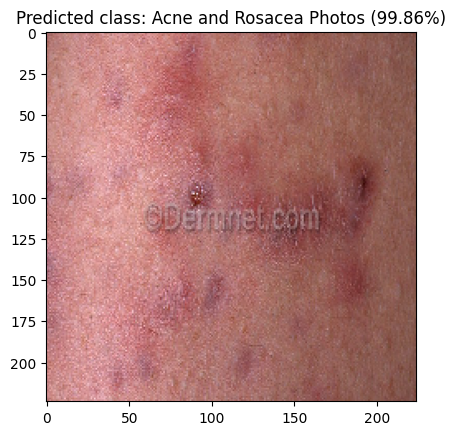



1/1 [==============================] - 0s 32ms/step
Image name: acne-cystic-89.jpg
Predicted class: Acne and Rosacea Photos (99.99%)
Prediction:  ['99.99%', '0.00%', '0.00%', '0.00%', '0.00%', '0.00%']


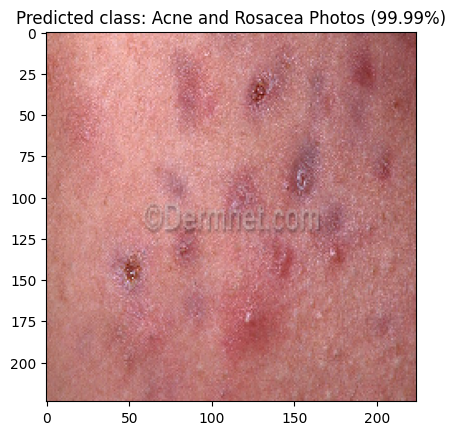



1/1 [==============================] - 0s 41ms/step
Image name: acne-cystic-86.jpg
Predicted class: Acne and Rosacea Photos (100.00%)
Prediction:  ['100.00%', '0.00%', '0.00%', '0.00%', '0.00%', '0.00%']


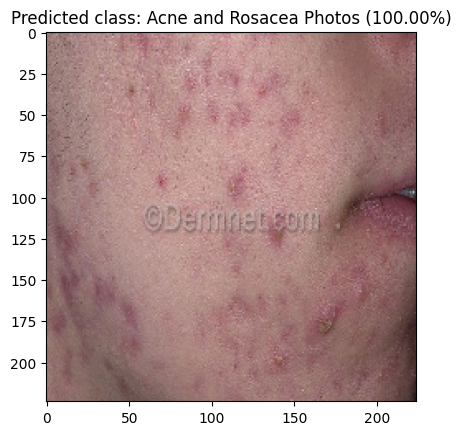



1/1 [==============================] - 0s 35ms/step
Image name: acne-cystic-55.jpg
Predicted class: Acne and Rosacea Photos (100.00%)
Prediction:  ['100.00%', '0.00%', '0.00%', '0.00%', '0.00%', '0.00%']


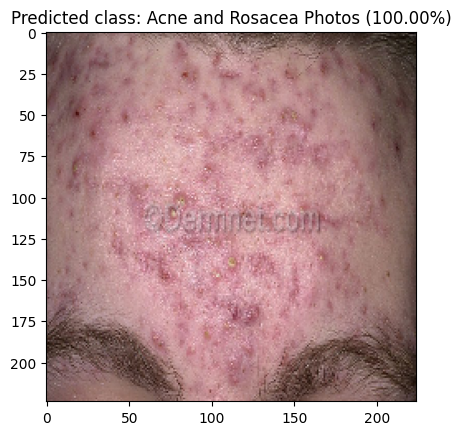



1/1 [==============================] - 0s 30ms/step
Image name: acne-cystic-53.jpg
Predicted class: Acne and Rosacea Photos (100.00%)
Prediction:  ['100.00%', '0.00%', '0.00%', '0.00%', '0.00%', '0.00%']


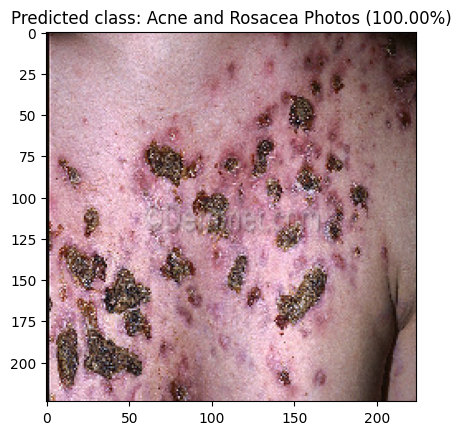



1/1 [==============================] - 0s 34ms/step
Image name: acne-cystic-52.jpg
Predicted class: Acne and Rosacea Photos (100.00%)
Prediction:  ['100.00%', '0.00%', '0.00%', '0.00%', '0.00%', '0.00%']


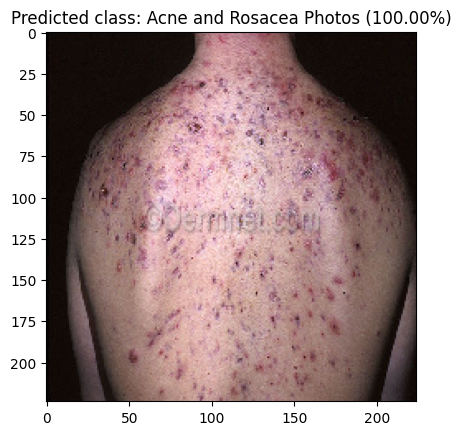



1/1 [==============================] - 0s 34ms/step
Image name: acne-cystic-30.jpg
Predicted class: Acne and Rosacea Photos (100.00%)
Prediction:  ['100.00%', '0.00%', '0.00%', '0.00%', '0.00%', '0.00%']


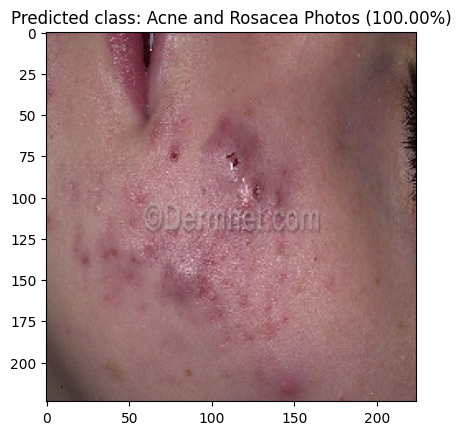



1/1 [==============================] - 0s 30ms/step
Image name: acne-cystic-3.jpg
Predicted class: Acne and Rosacea Photos (99.93%)
Prediction:  ['99.93%', '0.02%', '0.03%', '0.00%', '0.00%', '0.01%']


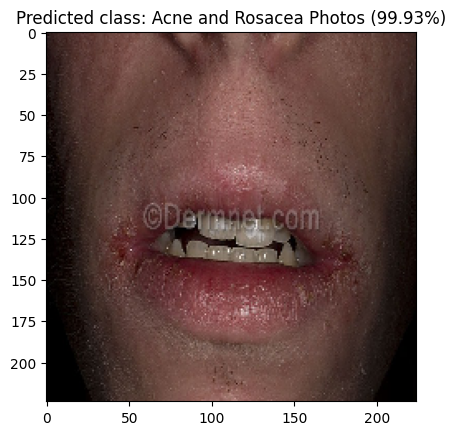



1/1 [==============================] - 0s 40ms/step
Image name: acne-cystic-44.jpg
Predicted class: Acne and Rosacea Photos (99.70%)
Prediction:  ['99.70%', '0.19%', '0.07%', '0.00%', '0.01%', '0.03%']


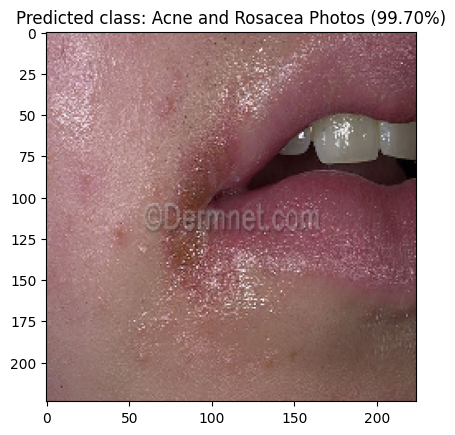



1/1 [==============================] - 0s 45ms/step
Image name: acne-cystic-40.jpg
Predicted class: Acne and Rosacea Photos (98.66%)
Prediction:  ['98.66%', '0.05%', '0.36%', '0.00%', '0.20%', '0.72%']


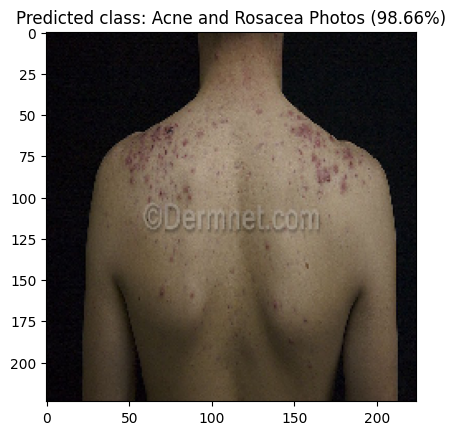



1/1 [==============================] - 0s 66ms/step
Image name: acne-cystic-46.jpg
Predicted class: Acne and Rosacea Photos (100.00%)
Prediction:  ['100.00%', '0.00%', '0.00%', '0.00%', '0.00%', '0.00%']


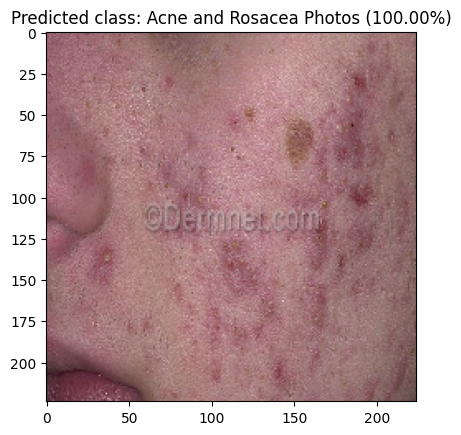



1/1 [==============================] - 0s 35ms/step
Image name: acne-cystic-45.jpg
Predicted class: Acne and Rosacea Photos (99.15%)
Prediction:  ['99.15%', '0.69%', '0.02%', '0.00%', '0.01%', '0.14%']


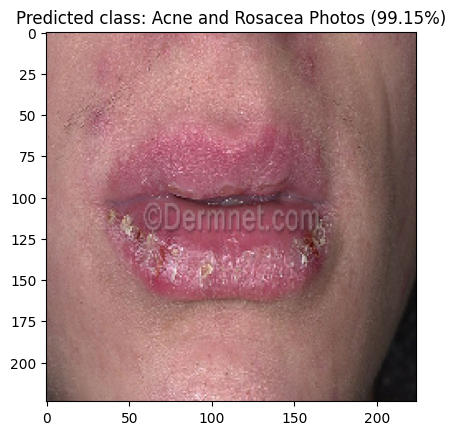



1/1 [==============================] - 0s 40ms/step
Image name: acne-cystic-33.jpg
Predicted class: Acne and Rosacea Photos (100.00%)
Prediction:  ['100.00%', '0.00%', '0.00%', '0.00%', '0.00%', '0.00%']


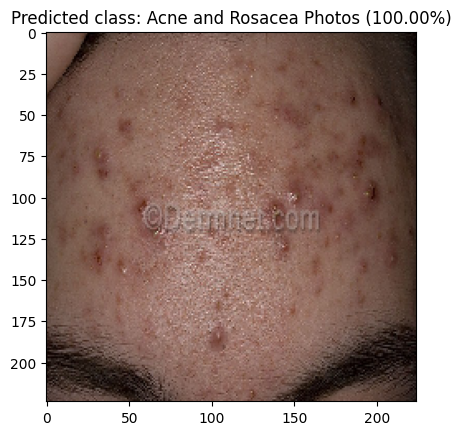



1/1 [==============================] - 0s 35ms/step
Image name: acne-cystic-19.jpg
Predicted class: Acne and Rosacea Photos (99.96%)
Prediction:  ['99.96%', '0.04%', '0.00%', '0.00%', '0.00%', '0.00%']


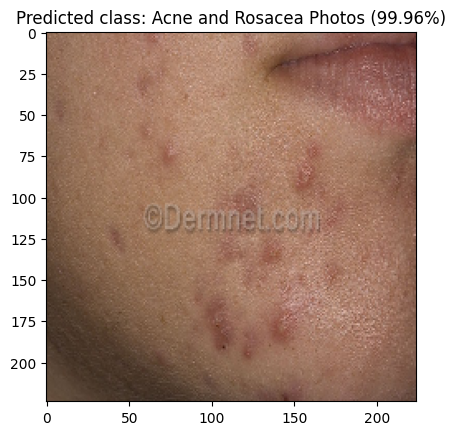



1/1 [==============================] - 0s 34ms/step
Image name: acne-cystic-18.jpg
Predicted class: Acne and Rosacea Photos (100.00%)
Prediction:  ['100.00%', '0.00%', '0.00%', '0.00%', '0.00%', '0.00%']


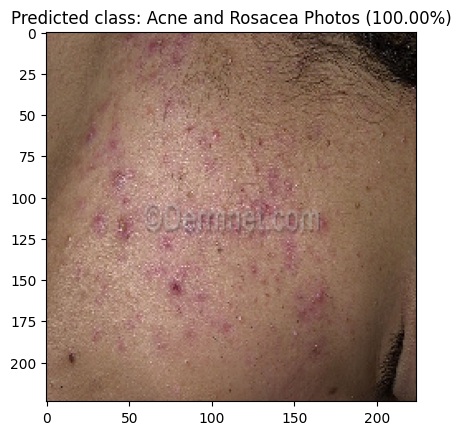



1/1 [==============================] - 0s 35ms/step
Image name: Psoriasis-Chronic-Plaque-19.jpg
Predicted class: Psoriasis pictures Lichen Planus and related diseases (99.99%)
Prediction:  ['0.01%', '0.00%', '0.00%', '0.00%', '99.99%', '0.00%']


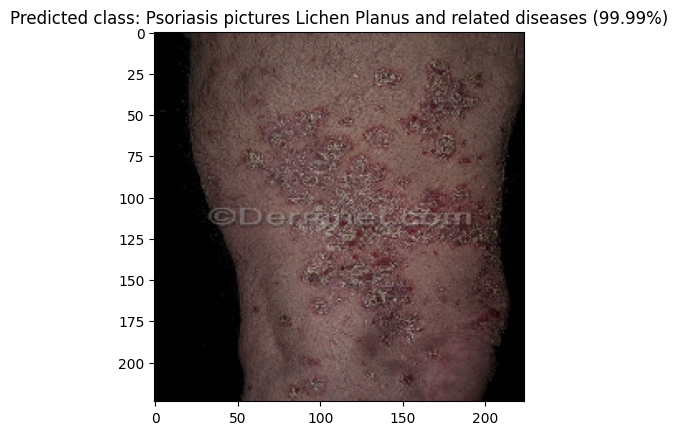



1/1 [==============================] - 0s 39ms/step
Image name: Psoriasis-Chronic-Plaque-131.jpg
Predicted class: Psoriasis pictures Lichen Planus and related diseases (99.74%)
Prediction:  ['0.20%', '0.05%', '0.01%', '0.00%', '99.74%', '0.00%']


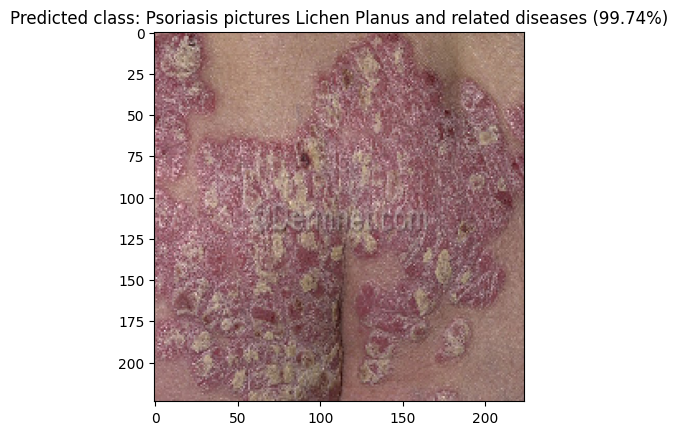



1/1 [==============================] - 0s 54ms/step
Image name: Psoriasis-Chronic-Plaque-93.jpg
Predicted class: Psoriasis pictures Lichen Planus and related diseases (99.98%)
Prediction:  ['0.00%', '0.00%', '0.01%', '0.00%', '99.98%', '0.00%']


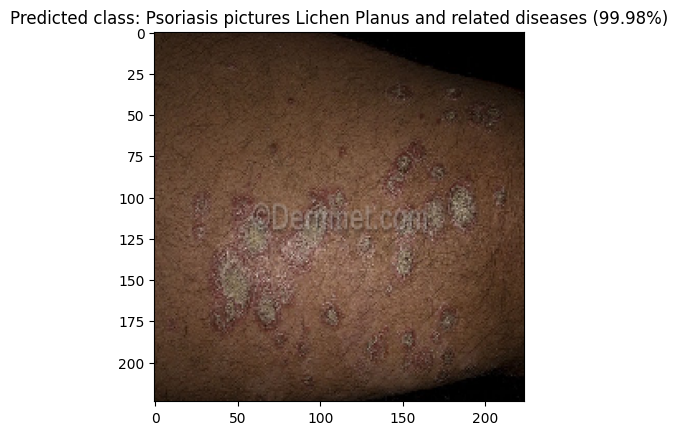



1/1 [==============================] - 0s 38ms/step
Image name: Psoriasis-Chronic-Plaque-181.jpg
Predicted class: Urticaria Hives (49.87%)
Prediction:  ['5.48%', '1.13%', '0.00%', '0.00%', '43.52%', '49.87%']


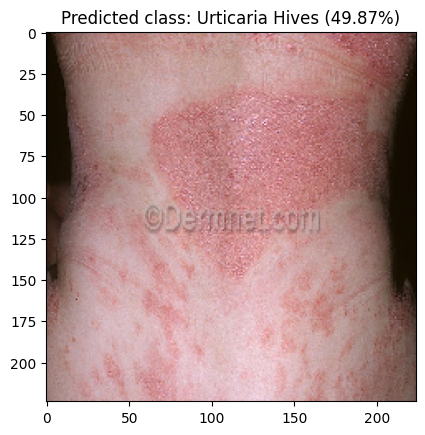



1/1 [==============================] - 0s 31ms/step
Image name: Psoriasis-Chronic-Plaque-176.jpg
Predicted class: Eczema Photos (96.68%)
Prediction:  ['0.01%', '96.68%', '0.00%', '0.00%', '3.32%', '0.00%']


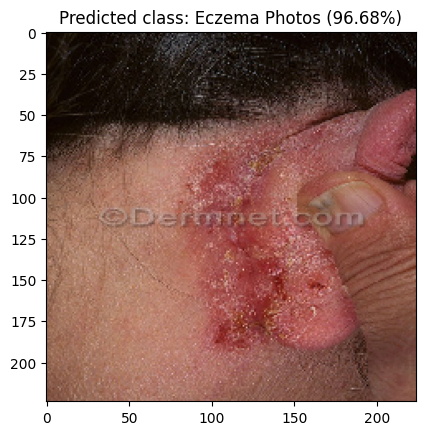



1/1 [==============================] - 0s 31ms/step
Image name: Psoriasis-Chronic-Plaque-160.jpg
Predicted class: Light Diseases and Disorders of Pigmentation (63.21%)
Prediction:  ['2.19%', '34.12%', '63.21%', '0.00%', '0.14%', '0.34%']


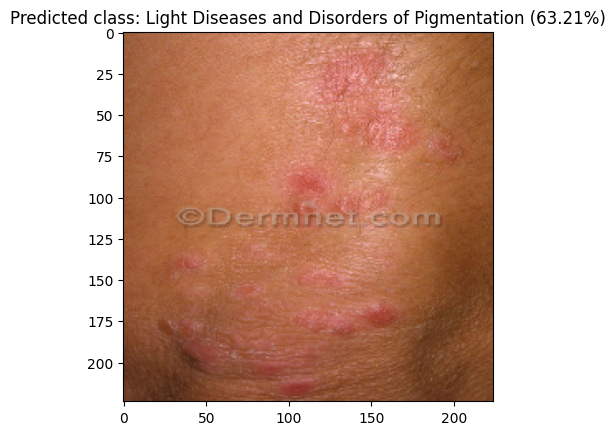



1/1 [==============================] - 0s 32ms/step
Image name: Psoriasis-Chronic-Plaque-123.jpg
Predicted class: Psoriasis pictures Lichen Planus and related diseases (99.80%)
Prediction:  ['0.07%', '0.00%', '0.13%', '0.00%', '99.80%', '0.00%']


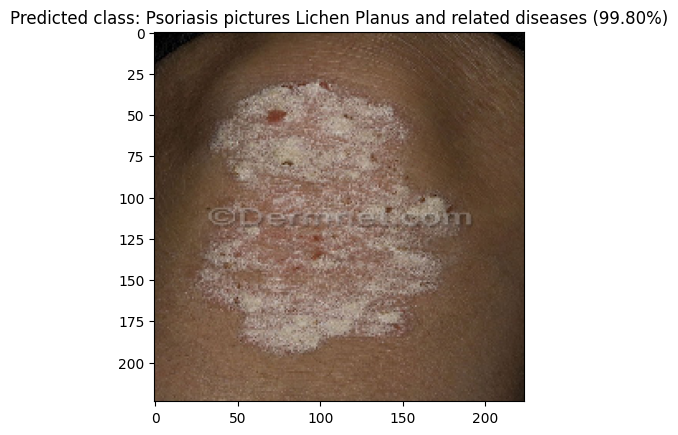



1/1 [==============================] - 0s 40ms/step
Image name: Psoriasis-Chronic-Plaque-14.jpg
Predicted class: Psoriasis pictures Lichen Planus and related diseases (100.00%)
Prediction:  ['0.00%', '0.00%', '0.00%', '0.00%', '100.00%', '0.00%']


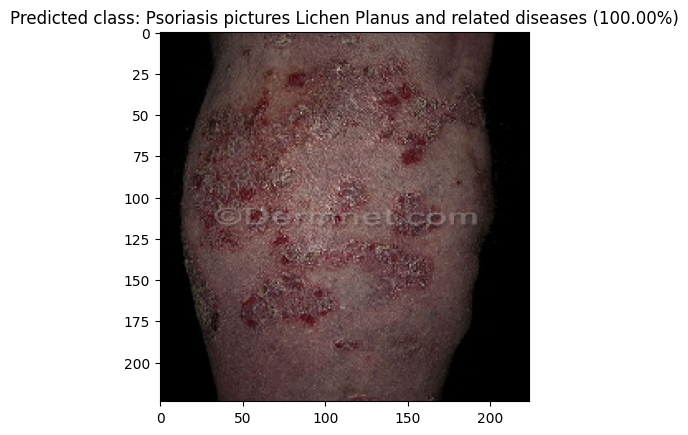



1/1 [==============================] - 0s 31ms/step
Image name: Psoriasis-Chronic-Plaque-122.jpg
Predicted class: Psoriasis pictures Lichen Planus and related diseases (99.98%)
Prediction:  ['0.00%', '0.01%', '0.01%', '0.00%', '99.98%', '0.00%']


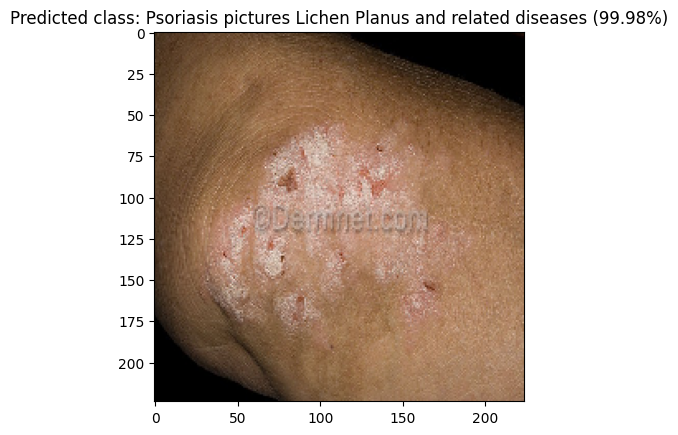



1/1 [==============================] - 0s 38ms/step
Image name: Psoriasis-Chronic-Plaque-121.jpg
Predicted class: Psoriasis pictures Lichen Planus and related diseases (99.64%)
Prediction:  ['0.15%', '0.06%', '0.03%', '0.00%', '99.64%', '0.11%']


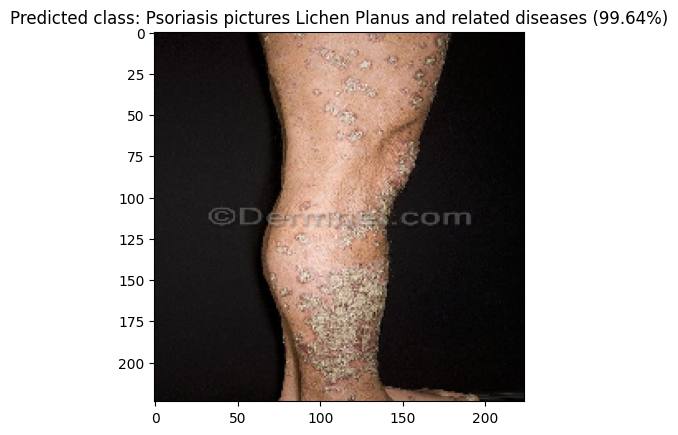



1/1 [==============================] - 0s 34ms/step
Image name: Psoriasis-Chronic-Plaque-1.jpg
Predicted class: Eczema Photos (73.51%)
Prediction:  ['0.34%', '73.51%', '20.11%', '0.00%', '5.11%', '0.93%']


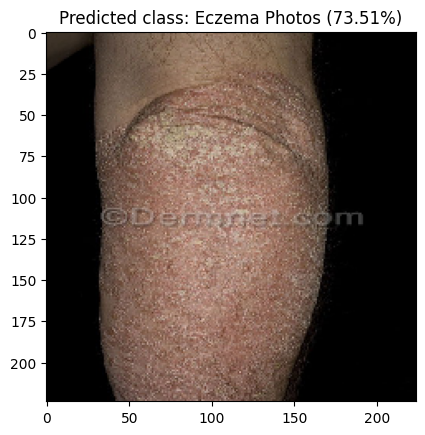



1/1 [==============================] - 0s 34ms/step
Image name: normal_ (9).jpg
Predicted class: Normal skin (100.00%)
Prediction:  ['0.00%', '0.00%', '0.00%', '100.00%', '0.00%', '0.00%']


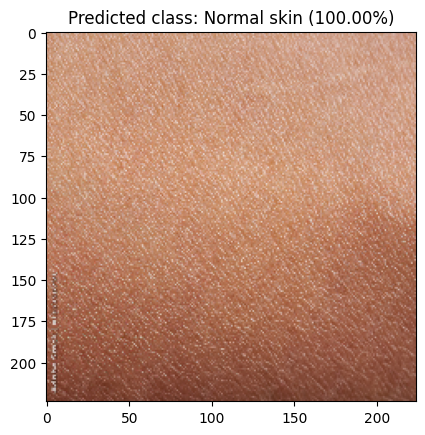



1/1 [==============================] - 0s 32ms/step
Image name: normal_ (4).jpg
Predicted class: Normal skin (99.19%)
Prediction:  ['0.25%', '0.41%', '0.09%', '99.19%', '0.01%', '0.05%']


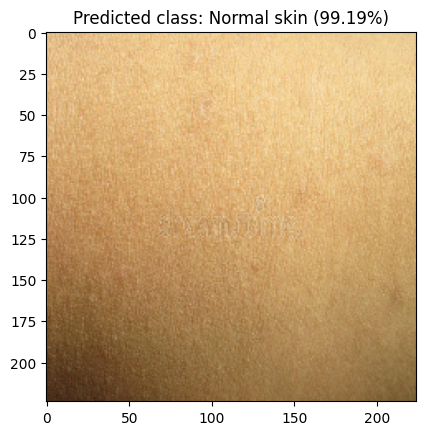



1/1 [==============================] - 0s 31ms/step
Image name: normal_ (5).jpg
Predicted class: Normal skin (99.80%)
Prediction:  ['0.03%', '0.00%', '0.01%', '99.80%', '0.00%', '0.15%']


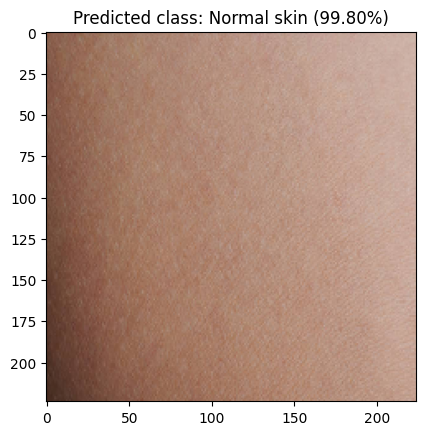



1/1 [==============================] - 0s 38ms/step
Image name: normal_ (3).jpg
Predicted class: Normal skin (99.55%)
Prediction:  ['0.22%', '0.01%', '0.15%', '99.55%', '0.00%', '0.06%']


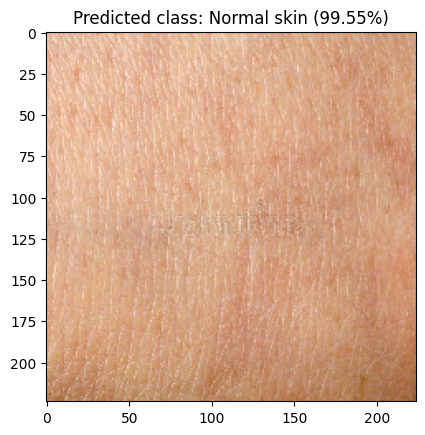



1/1 [==============================] - 0s 33ms/step
Image name: normal_ (17).jpg
Predicted class: Normal skin (100.00%)
Prediction:  ['0.00%', '0.00%', '0.00%', '100.00%', '0.00%', '0.00%']


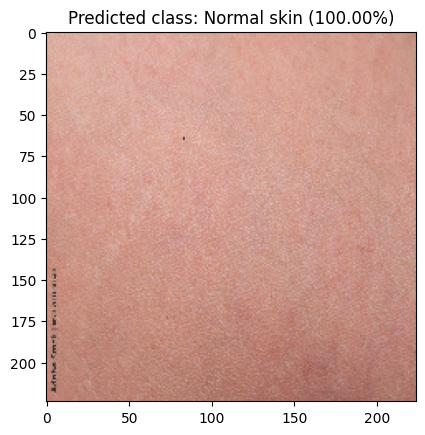



1/1 [==============================] - 0s 37ms/step
Image name: normal_ (12).jpg
Predicted class: Normal skin (99.99%)
Prediction:  ['0.00%', '0.00%', '0.00%', '99.99%', '0.00%', '0.00%']


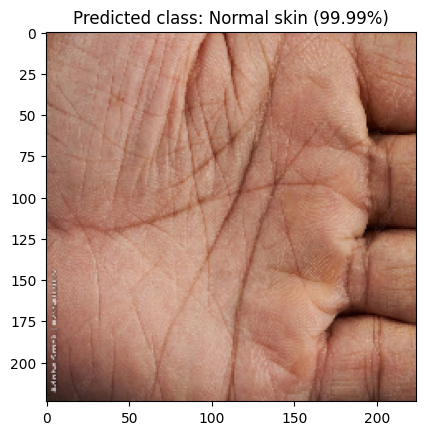



1/1 [==============================] - 0s 39ms/step
Image name: normal_ (16).jpg
Predicted class: Light Diseases and Disorders of Pigmentation (54.81%)
Prediction:  ['0.80%', '0.00%', '54.81%', '44.38%', '0.00%', '0.00%']


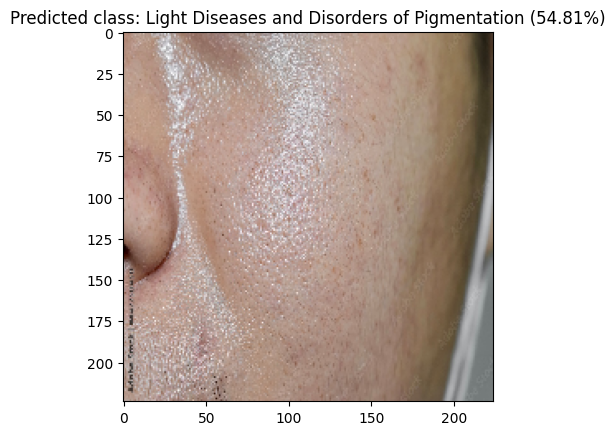



1/1 [==============================] - 0s 37ms/step
Image name: normal_ (18).jpg
Predicted class: Normal skin (100.00%)
Prediction:  ['0.00%', '0.00%', '0.00%', '100.00%', '0.00%', '0.00%']


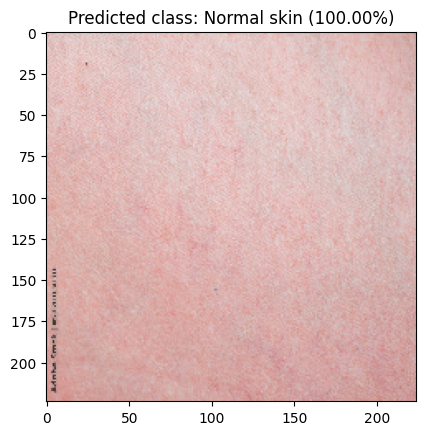



1/1 [==============================] - 0s 38ms/step
Image name: normal_ (2).webp
Predicted class: Normal skin (99.88%)
Prediction:  ['0.04%', '0.00%', '0.06%', '99.88%', '0.00%', '0.02%']


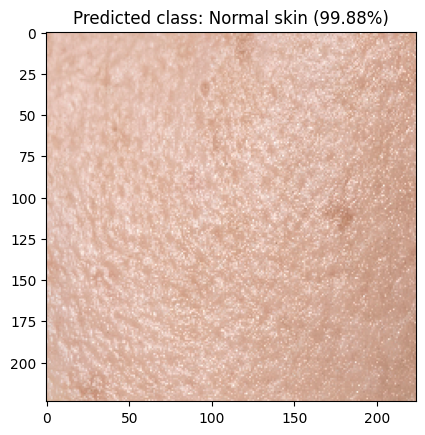



1/1 [==============================] - 0s 35ms/step
Image name: normal_ (10).jpg
Predicted class: Normal skin (99.89%)
Prediction:  ['0.05%', '0.00%', '0.01%', '99.89%', '0.00%', '0.05%']


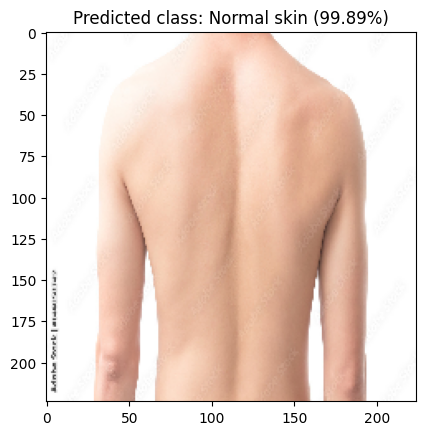



1/1 [==============================] - 0s 53ms/step
Image name: lentigo-adults-8.jpg
Predicted class: Eczema Photos (97.19%)
Prediction:  ['0.00%', '97.19%', '2.81%', '0.00%', '0.00%', '0.00%']


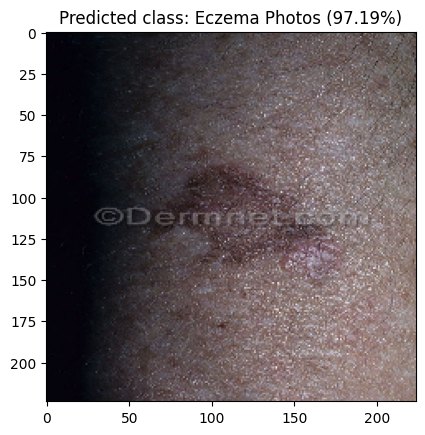



1/1 [==============================] - 0s 102ms/step
Image name: lentigo-adults-42.jpg
Predicted class: Light Diseases and Disorders of Pigmentation (70.15%)
Prediction:  ['1.45%', '0.46%', '70.15%', '1.33%', '26.60%', '0.00%']


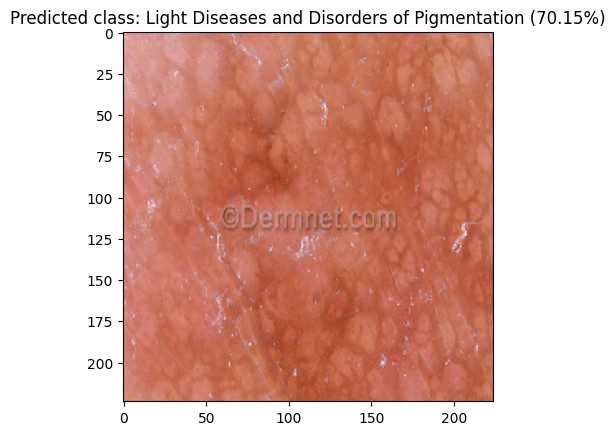



1/1 [==============================] - 0s 101ms/step
Image name: lentigo-adults-16.jpg
Predicted class: Eczema Photos (65.07%)
Prediction:  ['0.90%', '65.07%', '21.47%', '1.11%', '0.02%', '11.43%']


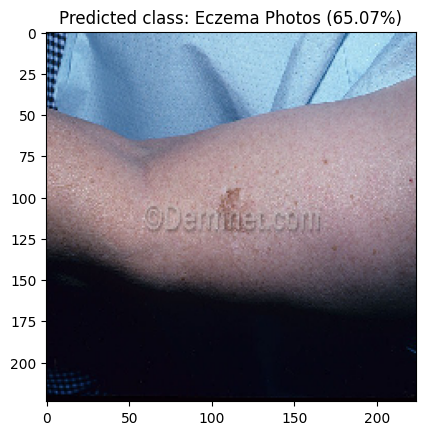



1/1 [==============================] - 0s 82ms/step
Image name: hives-Urticaria-Acute-89.jpg
Predicted class: Urticaria Hives (88.49%)
Prediction:  ['3.96%', '0.03%', '7.47%', '0.04%', '0.00%', '88.49%']


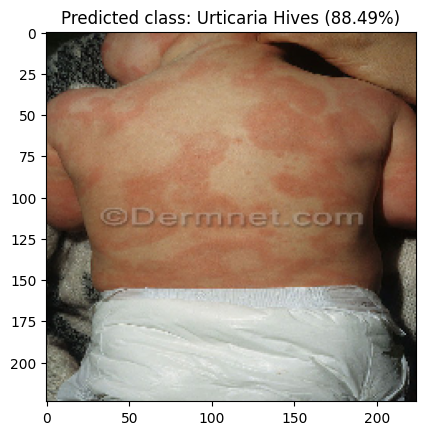



1/1 [==============================] - 0s 200ms/step
Image name: lentigo-adults-3.jpg
Predicted class: Light Diseases and Disorders of Pigmentation (98.05%)
Prediction:  ['1.32%', '0.03%', '98.05%', '0.56%', '0.00%', '0.04%']


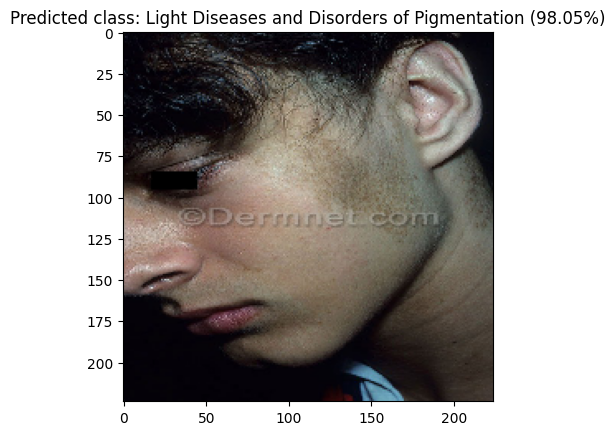



1/1 [==============================] - 0s 154ms/step
Image name: lentigo-adults-37.jpg
Predicted class: Light Diseases and Disorders of Pigmentation (99.60%)
Prediction:  ['0.09%', '0.28%', '99.60%', '0.00%', '0.00%', '0.04%']


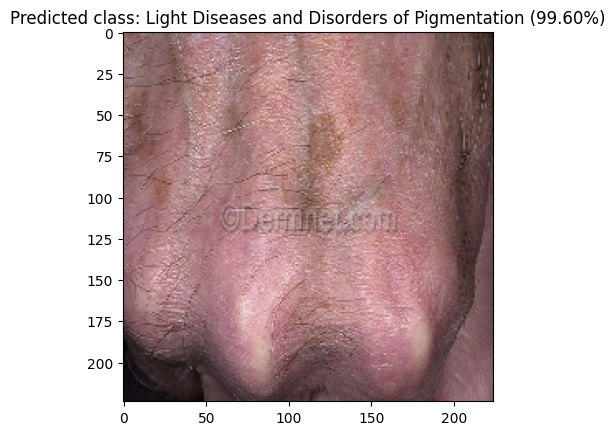



1/1 [==============================] - 0s 101ms/step
Image name: lentigo-adults-34.jpg
Predicted class: Light Diseases and Disorders of Pigmentation (98.74%)
Prediction:  ['0.32%', '0.88%', '98.74%', '0.06%', '0.00%', '0.00%']


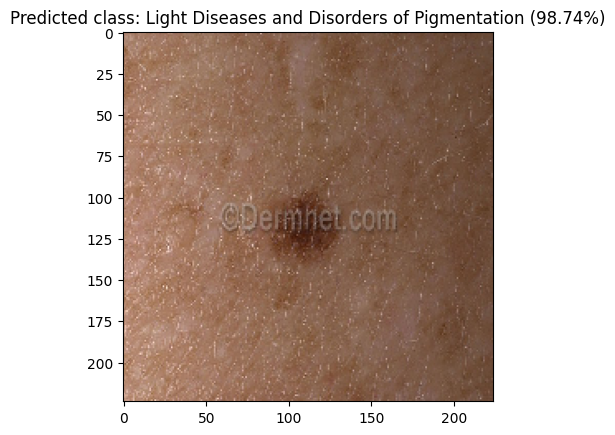



1/1 [==============================] - 0s 90ms/step
Image name: hives-Urticaria-Acute-90.jpg
Predicted class: Urticaria Hives (99.88%)
Prediction:  ['0.10%', '0.01%', '0.00%', '0.00%', '0.01%', '99.88%']


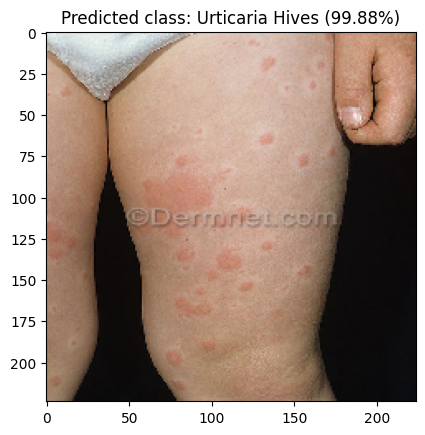



1/1 [==============================] - 0s 138ms/step
Image name: hives-Urticaria-Acute-86.jpg
Predicted class: Eczema Photos (75.94%)
Prediction:  ['20.63%', '75.94%', '0.01%', '0.00%', '3.42%', '0.00%']


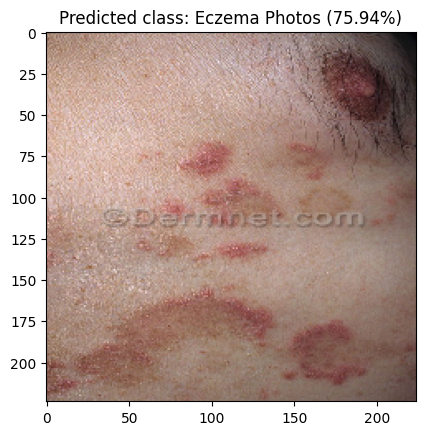



1/1 [==============================] - 0s 119ms/step
Image name: hives-Urticaria-Acute-73.jpg
Predicted class: Urticaria Hives (99.97%)
Prediction:  ['0.01%', '0.00%', '0.01%', '0.01%', '0.00%', '99.97%']


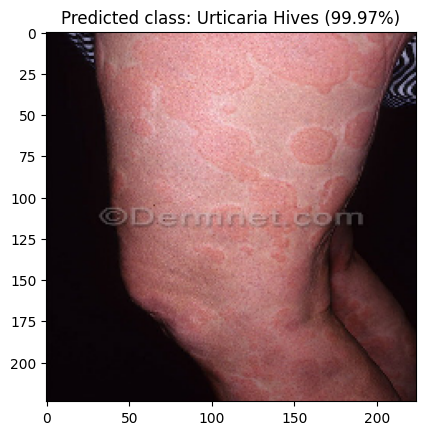

In [ ]:
# Loop through each image in the folder
for filename in os.listdir(folder_path):
    # Load the image
    img_path = os.path.join(folder_path, filename)
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = tf.keras.applications.mobilenet_v3.preprocess_input(img_array)

    # Make prediction
    prediction = model_0.predict(img_array)
    class_names = train_generator.class_indices
    class_names = {v: k for k, v in class_names.items()} # reverse the class_indices dictionary
    predicted_class = np.argmax(prediction, axis=1)
    predicted_class_name = class_names[predicted_class[0]]
    predicted_prob = np.max(prediction, axis=1)

    # Print the result
    print("Image name:", filename)
    print("Predicted class: {} ({:.2f}%)".format(predicted_class_name, predicted_prob[0]*100))
    prediction_list = prediction.tolist() # Convert the NumPy array to a Python list
    prediction_formatted = ["{:.2%}".format(p) for p in prediction_list[0]]
    print("Prediction: ", prediction_formatted)
    plt.imshow(img)
    plt.title("Predicted class: {} ({:.2f}%)".format(predicted_class_name, predicted_prob[0]*100))
    plt.show()
    print("\n")

#Save & Load h5 Model


In [ ]:
# Save the trained model to a .h5 file
model_0.save('/content/gdrive/MyDrive/dataset/model/savedmodel.h5')

In [ ]:
from keras.models import load_model
loadmodel = load_model('/content/gdrive/MyDrive/dataset/model/savedmodel.h5')